## **GIS Analysis of Service NOW Company A Company J data**

Import packages

In [72]:
import numpy as np
import pandas as pd
import plotly
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARIMAResults
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import datetime
import statsmodels.api as sm
from matplotlib import pyplot
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [33]:
from google.colab import drive
drive.mount('drive', force_remount=True)

Mounted at drive


**Begin Analysis for Company A - US Locations**

In [34]:
#Open the csv of US data, category, ticket duration in hours (Company A)
df = pd.read_csv('/content/drive/Shareddrives/IST 718 Project/us_locations.csv')
df.head()

,city,state,actual_category,hours
0,san diego,ca,security,0.100000
1,tampa,fl,software,24.200000
2,raleigh,nc,computer hardware,22.383333
3,portland,or,software,0.933333
4,manchester,nh,access-issue/request,76.733333


In [35]:
#Concatenate city state to location (Company A)
df['location'] = df['city'].str.cat(df['state'],sep=", ")
df.head()

,city,state,actual_category,hours,location
0,san diego,ca,security,0.100000,"san diego, ca"
1,tampa,fl,software,24.200000,"tampa, fl"
2,raleigh,nc,computer hardware,22.383333,"raleigh, nc"
3,portland,or,software,0.933333,"portland, or"
4,manchester,nh,access-issue/request,76.733333,"manchester, nh"


**Descriptive Statistics of Company A Data**


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



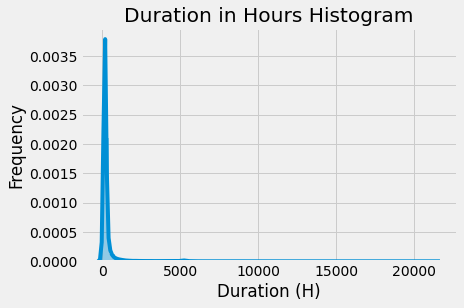

In [36]:
# CREATE A HISTOGRAM OF Time Duration in Hours (Company A)
import matplotlib.pyplot as plt 
import seaborn as sns
ax = sns.distplot(df['hours'])
plt.title("Duration in Hours Histogram")
plt.xlabel('Duration (H)')
plt.ylabel('Frequency')
plt.show()

In [37]:
#Create violin plots of ticket duration by category (Company A)
import plotly.express as px
fig = px.violin(df, y="hours", x="actual_category", box=True, # draw box plot inside the violin
                points="all", 
               )
fig.show()

In [38]:
#Remove outliers
df2 = df[df.hours<(90*24)]

In [ ]:
#Create box plots of ticket duration by category, outliers removed (Company A)
import plotly.express as px
fig = px.box(df2, x="actual_category", y="hours", color_discrete_sequence=px.colors.qualitative.Vivid, points="all")
fig.show()

In [ ]:
#Create boxplots by location Company A
fig = px.box(df2, x="location", y="hours", color="state")
fig.show()

# **Examine Company A Data in geospatial environment**

In [ ]:
#Get the geo-locations for each of origin locations
#Data were retrived using a seconday colab file

In [46]:
#Read in csv with new locations form Company A US locations
df3 = pd.read_csv('/content/drive/Shareddrives/IST 718 Project/us_loc_2k.csv')
df3.head()

,Unnamed: 0,city,state,actual_category,hours,location,location2,point,latitude,longitude,altitude
0,0,san diego,ca,security,0.100000,"san diego, ca","San Diego, San Diego County, California, Unite...","(32.7174202, -117.1627728, 0.0)",32.717420,-117.162773,0.0
1,1,tampa,fl,software,24.200000,"tampa, fl","Tampa, Hillsborough County, Florida, 33602, Un...","(27.9477595, -82.458444, 0.0)",27.947759,-82.458444,0.0
2,2,raleigh,nc,computer hardware,22.383333,"raleigh, nc","Raleigh, Wake County, North Carolina, United S...","(35.7803977, -78.6390989, 0.0)",35.780398,-78.639099,0.0
3,3,portland,or,software,0.933333,"portland, or","Portland, Metro, Multnomah County, Oregon, Uni...","(45.5202471, -122.6741949, 0.0)",45.520247,-122.674195,0.0
4,4,manchester,nh,access-issue/request,76.733333,"manchester, nh","Manchester, Hillsborough County, New Hampshire...","(42.9956397, -71.4547891, 0.0)",42.995640,-71.454789,0.0


In [ ]:
#Plot Company A US Locations ticket duratioon on map colored by category 
mapbox_access_token = 'pk.eyJ1IjoidnNtaWxsZXIiLCJhIjoiY2tpMmgwMW10MmZ6cDJ6bnR3cnZ6N2E0eSJ9.Hs3fSyL7D862FtohKmTALg'
px.set_mapbox_access_token(mapbox_access_token)
fig = px.scatter_mapbox(df3, lat="latitude", lon="longitude", color="actual_category", size="hours",
                  color_discrete_sequence=px.colors.qualitative.Alphabet, size_max=10, zoom=3, mapbox_style='dark')
fig.show()

In [81]:
#Plot a heat map of ticket duration (Company A)
fig = px.density_mapbox(df3, lat='latitude', lon='longitude', z='hours', radius=10,
                        center=dict(lat=40, lon=-90), zoom=3,
                        mapbox_style="stamen-toner")
fig.show()
fig.write_html('/content/drive/Shareddrives/IST 718 Project/us_layer_companyA_map.html', full_html=False, include_plotlyjs='cdn')

In [47]:
#Company A, map layers folium map
import folium 
#Create map project
m = folium.Map(location=[38.395, -96.544], zoom_start=5)
#add tiles to the map
folium.raster_layers.TileLayer('Open Street Map').add_to(m)
folium.raster_layers.TileLayer('Stamen Toner').add_to(m)
folium.raster_layers.TileLayer('Stamen Terrain').add_to(m)
folium.raster_layers.TileLayer('CartoDB Dark_Matter').add_to(m)

#add layer control to show differenc maps
folium.LayerControl().add_to(m)

#plot the location of the service calls
for (index, row) in df3.iterrows():
  folium.Marker(location=[row.loc['latitude'], row.loc['longitude']], popup=row.loc['city']+ '  ' + row.loc['actual_category'],\
                icon=folium.Icon(color='orange',icon='wrench',prefix='fa'), tooltip='click').add_to(m)

#display map
m.save('/content/drive/Shareddrives/IST 718 Project/us_layer_map.html')
m


# **Examine Sites that closed the SNOW request and Number of Tickets Closed**

In [41]:
#Examined data by the site that closed the ticket
dfc = pd.read_csv('/content/drive/Shareddrives/IST 718 Project/closed_by_locations.csv')
dfc.head()

,Unnamed: 0,city,state,number,log_number,location,location2,point,latitude,longitude,altitude
0,0,los angeles,ca,86738,4.938209,"los angeles, ca","Los Angeles, Los Angeles County, California, U...","(34.0536909, -118.242766, 0.0)",34.053691,-118.242766,0.0
1,1,san francisco,ca,1041,3.017451,"san francisco, ca","San Francisco, San Francisco City and County, ...","(37.7790262, -122.4199061, 0.0)",37.779026,-122.419906,0.0
2,2,new york,ny,1295,3.112270,"new york, ny","New York, Stone Street Historic District, New ...","(40.7127281, -74.0060152, 0.0)",40.712728,-74.006015,0.0
3,3,dallas,tx,331,2.519828,"dallas, tx","Dallas, Dallas County, Texas, United States of...","(32.7762719, -96.7968559, 0.0)",32.776272,-96.796856,0.0
4,4,hunt valley,md,807,2.906874,"hunt valley, md","Hunt Valley, Cockeysville, Baltimore County, M...","(39.4922608, -76.6589528, 0.0)",39.492261,-76.658953,0.0


In [67]:
#Closing site location map layers folium map
import folium 
#Create map project
mc = folium.Map(location=[38.395, -96.544], zoom_start=5)
#add tiles to the map
folium.raster_layers.TileLayer('Stamen Toner').add_to(mc)

#add layer control to show differenc maps
folium.LayerControl().add_to(mc)

#plot the location of the service calls
for (index, row) in dfc.iterrows():
  folium.Marker(location=[row.loc['latitude'], row.loc['longitude']], popup=row.loc['city']+ '  ' + row.loc['state'],\
                icon=folium.Icon(color='blue',icon='check-circle',prefix='fa'), tooltip='click').add_to(mc)

#display map
mc.save('/content/drive/Shareddrives/IST 718 Project/closed_by_site_map_layers.html')
mc


In [49]:
#Create a list for the heatmap
closed_by_list = [[row['latitude'],row['longitude'], row['number']] for index, row in dfc.iterrows()]


In [70]:
from folium import plugins
map_heatmap1 = folium.Map([39.394, -96.544],zoom_start=5)
folium.raster_layers.TileLayer('CartoDB dark_matter').add_to(map_heatmap1)
plugins.HeatMap(closed_by_list).add_to(map_heatmap1)
map_heatmap1.save('/content/drive/Shareddrives/IST 718 Project/closed_by_ticket_duration_heat.html')
map_heatmap1

# **Examine Company J Data in geospatial environment**

In [51]:
#Perform the analysis for company J
j_df = pd.read_csv('/content/drive/Shareddrives/IST 718 Project/comp_j_locations.csv')
df.dropna(axis=0, how='any',subset=None, inplace=False)
j_df['hours '] =j_df['hours '].astype(float)
j_df.head()

,location,actual_category,hours
0,"Sunnyvale, CA",Desktop or laptop,44.666667
1,"Westford, MA",Easy connect,6.533333
2,"Houston, TX",Desktop or laptop,255.933333
3,"Taikoo Shing, Hong Kong",Desktop or laptop,527.883333
4,"Sunnyvale, CA",Application support,0.100000


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



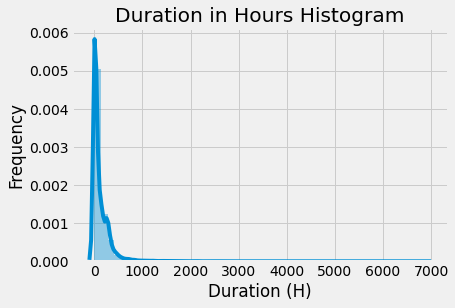

In [52]:
# CREATE A HISTOGRAM OF Time Duration in Hours for company j
ax = sns.distplot(j_df['hours '])
plt.title("Duration in Hours Histogram")
plt.xlabel('Duration (H)')
plt.ylabel('Frequency')
plt.show()

In [53]:
import plotly.express as px
fig = px.violin(j_df, y="hours ", x="actual_category", box=True, # draw box plot inside the violin
                points="all", 
               )
fig.show()

In [54]:
import plotly.express as px
fig = px.box(j_df, x="actual_category", y="hours ",color="actual_category",color_discrete_sequence=px.colors.qualitative.Dark24, points="all")
fig.show()

In [55]:
#Get the geo-locations for each of origin locations
j_df2= pd.read_csv('/content/drive/Shareddrives/IST 718 Project/j1_datatime_loc.csv')

In [56]:
j_df2.dropna(how='all',subset=None,inplace=False)

,Unnamed: 0,location,actual_category,hours,date_opened,time_opened,location2,point,latitude,longitude,altitude
0,0,"Sunnyvale, CA",Desktop or laptop,44.666667,6/9/2020,20:46,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0
1,1,"Westford, MA",Easy connect,6.533333,2/4/2020,7:46,"Westford, Middlesex County, Massachusetts, Uni...","(42.5792583, -71.4378411, 0.0)",42.579258,-71.437841,0.0
2,2,"Houston, TX",Desktop or laptop,255.933333,5/27/2020,11:06,"Houston, Harris County, Texas, United States o...","(29.7589382, -95.3676974, 0.0)",29.758938,-95.367697,0.0
3,3,"Taikoo Shing, Hong Kong",Desktop or laptop,527.883333,9/7/2020,3:46,"太古城 Taikoo Shing, 鰂魚涌 Quarry Bay, 東區 Eastern D...","(22.287584850000002, 114.21520740793562, 0.0)",22.287585,114.215207,0.0
4,4,"Sunnyvale, CA",Application support,0.100000,9/2/2020,3:38,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0
...,...,...,...,...,...,...,...,...,...,...,...
10041,10041,"Capistrano Beach, CA",Infrastructure Monitoring,338.383333,1/14/2020,10:32,"Capistrano Beach, Dana Point, Orange County, C...","(33.4625277, -117.6717175, 0.0)",33.462528,-117.671717,0.0
10042,10042,"Moscow, Russia",Application support,994.283333,12/6/2019,20:12,"Москва, Центральный федеральный округ, Россия","(55.7504461, 37.6174943, 0.0)",55.750446,37.617494,0.0
10043,10043,"Seoul, South Korea",Software,27.550000,10/18/2020,21:24,"서울, 대한민국","(37.5666791, 126.9782914, 0.0)",37.566679,126.978291,0.0
10044,10044,"Bangalore, India",Access and passwords,7.300000,4/23/2020,0:05,"Bengaluru, Bangalore North, Bangalore Urban, K...","(12.9791198, 77.5912997, 0.0)",12.979120,77.591300,0.0


In [57]:
#Asign numeric values to hours
j_df2['hours'] =j_df2['hours'].astype(float)

In [58]:
mapbox_access_token = 'pk.eyJ1IjoidnNtaWxsZXIiLCJhIjoiY2tpMmgwMW10MmZ6cDJ6bnR3cnZ6N2E0eSJ9.Hs3fSyL7D862FtohKmTALg'
px.set_mapbox_access_token(mapbox_access_token)
fig = px.scatter_mapbox(j_df2, lat="latitude", lon="longitude", color="actual_category", size="hours",
                  color_discrete_sequence=px.colors.qualitative.Alphabet, size_max=10, zoom=2, mapbox_style='dark')
fig.show()

In [80]:
#Heat Map of company J ticket duration by location
fig = px.density_mapbox(j_df2, lat='latitude', lon='longitude', z='hours', radius=10,
                        center=dict(lat=45, lon=-80), zoom=2,
                        mapbox_style="stamen-toner")
fig.show()
fig.write_html('/content/drive/Shareddrives/IST 718 Project/us_layer_companyJ_map.html', full_html=False, include_plotlyjs='cdn')

In [60]:
#Drop Nulls and non mumeric columns
j_df3=j_df2[['latitude','longitude','hours']]
j_df3 = j_df3[j_df3['latitude'].notna()]
j_df3.dropna()


,latitude,longitude,hours
0,37.368830,-122.036350,44.666667
1,42.579258,-71.437841,6.533333
2,29.758938,-95.367697,255.933333
3,22.287585,114.215207,527.883333
4,37.368830,-122.036350,0.100000
...,...,...,...
10041,33.462528,-117.671717,338.383333
10042,55.750446,37.617494,994.283333
10043,37.566679,126.978291,27.550000
10044,12.979120,77.591300,7.300000


In [78]:
#Create a heatmap of ticket duration based on call location for company J
import folium 
from folium import plugins
map_heatmap2 = folium.Map([39.912, -76.289], tiles= "CartoDB dark_matter",zoom_start=3, control_scale=True)
j_heat = [[row['latitude'],row['longitude'], row['hours']] for index, row in j_df3.iterrows()]
plugins.HeatMap(j_heat).add_to(map_heatmap2)
map_heatmap2.save('/content/drive/Shareddrives/IST 718 Project/company_j_ticket_duration_call_origin_heat.html')
map_heatmap2

# **Examine Company A and J outliers**

In [ ]:
df_a_out = pd.read_csv('/content/drive/Shareddrives/IST 718 Project/a_outlier_data.csv')
df_a_out.head()

,Unnamed: 0,location,actual_category,hours,date_opened,time_opened,location2,point,latitude,longitude,altitude
0,0,"Ontario, Canada",Desktop or laptop,0.083333,2019-12-18,15:02,"Ontario, Canada","(50.000678, -86.000977, 0.0)",50.000678,-86.000977,0.0
1,1,"Vienna, Italy",Desktop or laptop,192.383333,2020-10-02,11:56,"Vienna, 419, Via Andrea Bafile, Lido di Jesolo...","(45.4969549, 12.6201214, 0.0)",45.496955,12.620121,0.0
2,2,"Sunnyvale, CA",Infrastructure services,408.183333,2019-10-08,13:36,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0
3,3,"Sunnyvale, CA",Printers and peripherals,24.950000,2019-12-16,14:27,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0
4,4,"Sunnyvale, CA",Application support,0.533333,2020-01-09,16:55,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0


In [ ]:
import plotly.express as px
fig = px.scatter_geo(df_a_out, lon="longitude", lat="latitude", color="actual_category",
                     hover_name="actual_category", size="hours", projection="natural earth")
fig.show()

In [ ]:
df_j_out = pd.read_csv('/content/drive/Shareddrives/IST 718 Project/j_outlier_data.csv')
df_j_out.head()

,Unnamed: 0,location,actual_category,hours,date_opened,time_opened,location2,point,latitude,longitude,altitude
0,0,"Sunnyvale, CA",Desktop or laptop,349.682500,2019-12-23,13:21,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0
1,1,"Westford, MA",Desktop or laptop,785.021111,2019-11-20,10:00,"Westford, Middlesex County, Massachusetts, Uni...","(42.5792583, -71.4378411, 0.0)",42.579258,-71.437841,0
2,2,"Sunnyvale, CA",Desktop or laptop,276.504722,2020-06-17,14:32,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0
3,3,"Westford, MA",Desktop or laptop,253.654167,2020-04-14,13:25,"Westford, Middlesex County, Massachusetts, Uni...","(42.5792583, -71.4378411, 0.0)",42.579258,-71.437841,0
4,4,"Bridgewater, MA",Desktop or laptop,6.114444,2019-12-20,10:22,"Bridgewater, Plymouth County, Massachusetts, 0...","(41.9903787, -70.9750426, 0.0)",41.990379,-70.975043,0


In [ ]:
fig = px.scatter_geo(df_j_out, lon="longitude", lat="latitude", color="actual_category",
                     hover_name="actual_category", size="hours", projection="natural earth")
fig.show()

In [ ]:
import plotly.express as px
df_comp = pd.read_csv('/content/drive/Shareddrives/IST 718 Project/company_outliers.csv')
a = df_comp["hours"].max()
fig = px.bar(df_comp, x="location", y="hours", color="actual_category",
  animation_frame="date_opened", animation_group="hours", range_y=[0,"a"])
fig.show()

In [ ]:

fig = px.scatter_geo(df_a_out, lon="longitude", lat="latitude", animation_frame="date_opened", animation_group="actual_category",
           size="hours", color="actual_category", hover_name="hours",
           projection="natural earth")
fig.show()

In [ ]:
from datetime import datetime
df_a_out.rename(columns={'date_opened':'Date1', 'time_opened':'Time'}, inplace=True)
df_a_out['Date'] = df_a_out[['Date1','Time']].apply(lambda x: ' '.join(x), axis=1)
df_a_out.head()


,Unnamed: 0,location,actual_category,hours,Date1,Time,location2,point,latitude,longitude,altitude,Date
0,0,"Ontario, Canada",Desktop or laptop,0.083333,2019-12-18,15:02,"Ontario, Canada","(50.000678, -86.000977, 0.0)",50.000678,-86.000977,0.0,2019-12-18 15:02
1,1,"Vienna, Italy",Desktop or laptop,192.383333,2020-10-02,11:56,"Vienna, 419, Via Andrea Bafile, Lido di Jesolo...","(45.4969549, 12.6201214, 0.0)",45.496955,12.620121,0.0,2020-10-02 11:56
2,2,"Sunnyvale, CA",Infrastructure services,408.183333,2019-10-08,13:36,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0,2019-10-08 13:36
3,3,"Sunnyvale, CA",Printers and peripherals,24.950000,2019-12-16,14:27,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0,2019-12-16 14:27
4,4,"Sunnyvale, CA",Application support,0.533333,2020-01-09,16:55,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0.0,2020-01-09 16:55


# **Time Series & Moving Average of Outliers**

In [ ]:
fig = px.bar(df_a_out, x="Date1", y="hours")
fig.show()

In [ ]:
df_j_out.rename(columns={'date_opened':'Date1', 'time_opened':'Time'}, inplace=True)
df_j_out['Date'] = df_j_out[['Date1','Time']].apply(lambda x: ' '.join(x), axis=1)
df_j_out.head()


,Unnamed: 0,location,actual_category,hours,Date1,Time,location2,point,latitude,longitude,altitude,Date
0,0,"Sunnyvale, CA",Desktop or laptop,349.682500,2019-12-23,13:21,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0,2019-12-23 13:21
1,1,"Westford, MA",Desktop or laptop,785.021111,2019-11-20,10:00,"Westford, Middlesex County, Massachusetts, Uni...","(42.5792583, -71.4378411, 0.0)",42.579258,-71.437841,0,2019-11-20 10:00
2,2,"Sunnyvale, CA",Desktop or laptop,276.504722,2020-06-17,14:32,"Sunnyvale, Santa Clara County, California, Uni...","(37.3688301, -122.0363496, 0.0)",37.368830,-122.036350,0,2020-06-17 14:32
3,3,"Westford, MA",Desktop or laptop,253.654167,2020-04-14,13:25,"Westford, Middlesex County, Massachusetts, Uni...","(42.5792583, -71.4378411, 0.0)",42.579258,-71.437841,0,2020-04-14 13:25
4,4,"Bridgewater, MA",Desktop or laptop,6.114444,2019-12-20,10:22,"Bridgewater, Plymouth County, Massachusetts, 0...","(41.9903787, -70.9750426, 0.0)",41.990379,-70.975043,0,2019-12-20 10:22


In [ ]:
fig = px.bar(df_j_out, x="Date1", y="hours")
fig.show()

In [ ]:
df_a_out['Date1'] =pd.to_datetime(df_a_out.Date1)
df_a_out['EMA'] = df_a_out['hours'].ewm(span=40, adjust=False).mean()

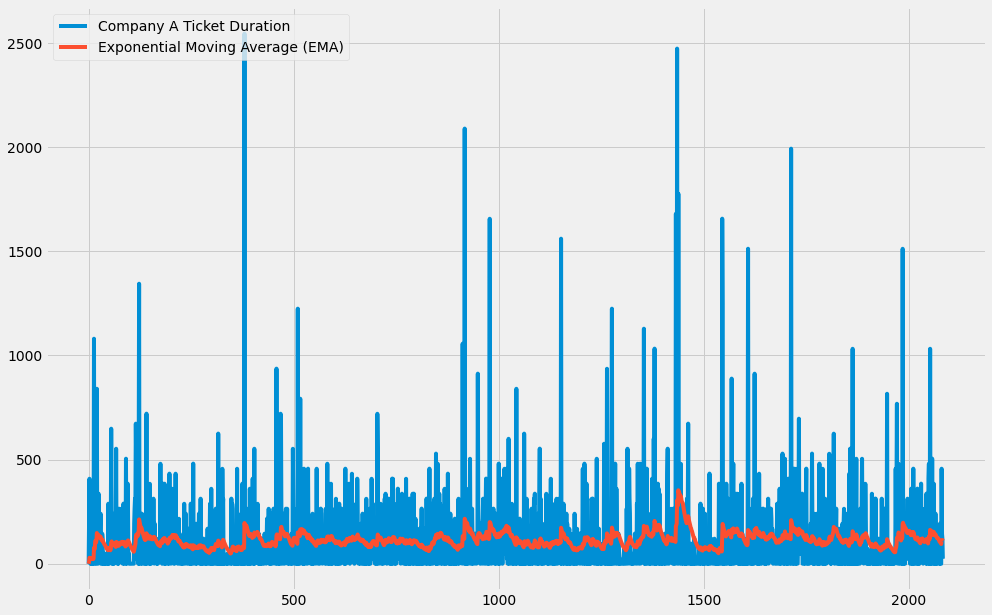

In [ ]:
plt.figure(figsize=[15,10])
plt.grid(True)
plt.plot(df_a_out['hours'],label='Company A Ticket Duration')
plt.plot(df_a_out['EMA'],label='Exponential Moving Average (EMA)')
plt.legend(loc=2)

In [ ]:
df_j_out['Date1'] =pd.to_datetime(df_a_out.Date1)
df_j_out['EMA'] = df_j_out['hours'].ewm(span=40, adjust=False).mean()

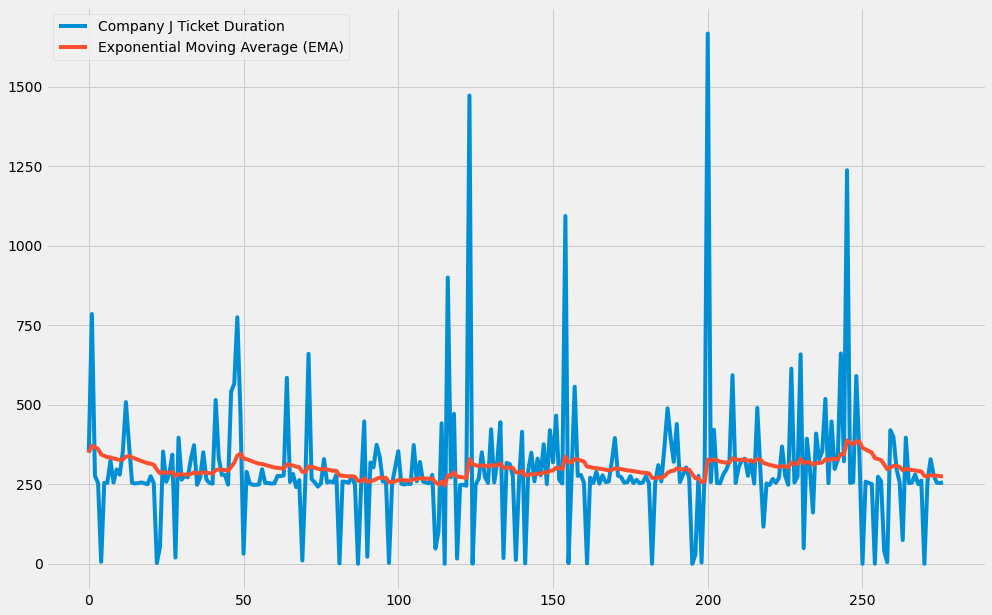

In [ ]:
plt.figure(figsize=[15,10])
plt.grid(True)
plt.plot(df_j_out['hours'],label='Company J Ticket Duration')
plt.plot(df_j_out['EMA'],label='Exponential Moving Average (EMA)')
plt.legend(loc=2)